# Analyzing Fatal Police Shootings in the U.S.

### Main question: Are police shootings in the US motivated by protected attributes such as race, gender, and age?

### Objective: Use prediction models including decision tree classifier and random-force algorithm to see if protected and unprotected variables could accurately predict geographical data of fatal police shooting as well as whether body camera was present and if the victim of the fatal police shooting showed signs of mental illness.

In [ ]:
!/opt/anaconda/bin/pip install --upgrade pip install
!/opt/anaconda/bin/pip install numpy
!/opt/anaconda/bin/pip install pandas
!/opt/anaconda/bin/pip install seaborn
!/opt/anaconda/bin/pip install matplotlib
!/opt/anaconda/bin/pip install scipy
!/opt/anaconda/bin/pip install plotly
!/opt/anaconda/bin/pip install scikit-learn==0.22.2
!/opt/anaconda/bin/pip install plotly==5.13.1

In [52]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt 
import scipy.stats as stats
import plotly.express as px
from scipy.stats import pearsonr
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix,plot_confusion_matrix,classification_report, accuracy_score
from sklearn import preprocessing

df = pd.read_csv('fatal_police_shootings_data.csv')

## Cleaning and preprocessing data

In [53]:
df['race'] = df['race'].replace(['A'], 'Asian')
df['race'] = df['race'].replace(['W'], 'White')
df['race'] = df['race'].replace(['H'], 'Hispanic')
df['race'] = df['race'].replace(['B'], 'Black')
df['race'] = df['race'].replace(['B;H'], 'Other')
df['race'] = df['race'].replace(['O'], 'Other')
df['race'] = df['race'].replace(['N'], 'Native-American')


df['armed_with'] = df['armed_with'].replace(['blunt_object'], 'blunt object')
df['armed_with'] = df['armed_with'].replace(['gun;vehicle'], 'gun and vehicle')
df['armed_with'] = df['armed_with'].replace(['vehicle;gun'], 'gun and vehicle')
df['armed_with'] = df['armed_with'].replace(['gun;knife'], 'gun and knife')
df['armed_with'] = df['armed_with'].replace(['other;gun'], 'other')
df['armed_with'] = df['armed_with'].replace(['knife;vehicle'], 'knife and vehicle')
df['armed_with'] = df['armed_with'].replace(['vehicle;knife;other'], 'knife and vehicle')
df['armed_with'] = df['armed_with'].replace(['blunt_object;knife'], 'knife and blunt object')
df['armed_with'] = df['armed_with'].replace(['knife;blunt_object'], 'knife and blunt object')
df['armed_with'] = df['armed_with'].replace(['blunt_object;blunt_object'], 'blunt object')
df['armed_with'] = df['armed_with'].replace(['replica;vehicle'], 'replica and vehicle')
df['armed_with'] = df['armed_with'].replace(['other;blunt_object;knife'], 'knife and blunt object')
df['armed_with'] = df['armed_with'].replace(['unknown'], 'undetermined')

In [54]:
# drop columns we are not analyzing
df = df.drop(columns=['id', 'date', 'location_precision', 'race_source', 'agency_ids'])
df.dropna()

,threat_type,flee_status,armed_with,city,county,state,latitude,longitude,name,age,gender,race,was_mental_illness_related,body_camera
0,point,not,gun,Shelton,Mason,WA,47.246826,-123.121592,Tim Elliot,53.0,male,Asian,True,False
1,point,not,gun,Aloha,Washington,OR,45.487421,-122.891696,Lewis Lee Lembke,47.0,male,White,False,False
2,move,not,unarmed,Wichita,Sedgwick,KS,37.694766,-97.280554,John Paul Quintero,23.0,male,Hispanic,False,False
3,point,not,replica,San Francisco,San Francisco,CA,37.762910,-122.422001,Matthew Hoffman,32.0,male,White,True,False
4,point,not,other,Evans,Weld,CO,40.383937,-104.692261,Michael Rodriguez,39.0,male,Hispanic,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8200,move,car,vehicle,Anthony,El Paso,TX,31.998501,-106.581154,Apolinar Lozano III,44.0,male,White,False,False
8207,threat,foot,gun,Marion,Grant,IN,40.535406,-85.640584,William White,34.0,male,Black,False,True
8209,move,other,vehicle,Winter Haven,Polk,FL,28.045483,-81.746013,Alex Greene,21.0,male,White,False,False
8215,shoot,not,gun,College Station,Brazos,TX,30.637756,-96.325909,Mark Bennett Hopkins,22.0,male,White,False,True


In [55]:
age = df['age']
age.value_counts().to_frame()

,age
32.0,268
31.0,264
34.0,261
27.0,260
33.0,259
...,...
78.0,1
89.0,1
8.0,1
92.0,1


In [56]:
city = df['city']
city.value_counts().to_frame()

,city
Los Angeles,133
Phoenix,106
Houston,91
Las Vegas,72
San Antonio,70
...,...
Chalmette,1
Lead,1
Brodhead,1
Pike County,1


In [59]:
county = df['county']
county.value_counts().to_frame()

,county
Los Angeles,153
Maricopa,90
Orange,50
Washington,46
Clark,42
...,...
Butts,1
Aitkin,1
Fredericksburg City,1
Hopewell City,1


In [60]:
city = df['city']
city.value_counts().to_frame()

,city
Los Angeles,133
Phoenix,106
Houston,91
Las Vegas,72
San Antonio,70
...,...
Chalmette,1
Lead,1
Brodhead,1
Pike County,1


In [61]:
threatType = df['threat_type']
threatType.value_counts().to_frame()

,threat_type
shoot,2308
threat,2168
point,1547
attack,1259
move,389
undetermined,334
flee,170
accident,47


In [62]:
suspectFled = df['flee_status']
suspectFled.value_counts().to_frame()

,flee_status
not,4511
car,1313
foot,1056
other,311


In [63]:
armedType = df['armed_with']
armedType.value_counts().to_frame()

,armed_with
gun,4717
knife,1393
undetermined,491
unarmed,465
vehicle,288
replica,276
blunt object,207
other,86
gun and vehicle,52
gun and knife,34


In [64]:
genderType = df['gender']
genderType.value_counts().to_frame()

,gender
male,7829
female,362
non-binary,1


In [65]:
hasBodyCam = df['body_camera']
hasBodyCam.value_counts().to_frame()

,body_camera
False,7044
True,1185


In [66]:
# binning ages
age_range = df['age']
age_range = pd.to_numeric(df["age"], errors='coerce')
age_range = age_range.dropna()
age_range = age_range.astype(int)
age_range

0       53
1       47
2       23
3       32
4       39
        ..
8221    34
8224    46
8226    63
8227    28
8228    27
Name: age, Length: 7697, dtype: int64

In [67]:
df['age_bins'] = pd.cut(age_range, bins=[0, 12, 17, 24, 34, 44, 54, 64, 74, 100], labels=['0-12','13-17','18-24','25-34','35-44','45-54','55-64','65-74','75 and above'])
age_bins = df['age_bins']
df.head()

,threat_type,flee_status,armed_with,city,county,state,latitude,longitude,name,age,gender,race,was_mental_illness_related,body_camera,age_bins
0,point,not,gun,Shelton,Mason,WA,47.246826,-123.121592,Tim Elliot,53.0,male,Asian,True,False,45-54
1,point,not,gun,Aloha,Washington,OR,45.487421,-122.891696,Lewis Lee Lembke,47.0,male,White,False,False,45-54
2,move,not,unarmed,Wichita,Sedgwick,KS,37.694766,-97.280554,John Paul Quintero,23.0,male,Hispanic,False,False,18-24
3,point,not,replica,San Francisco,San Francisco,CA,37.762910,-122.422001,Matthew Hoffman,32.0,male,White,True,False,25-34
4,point,not,other,Evans,Weld,CO,40.383937,-104.692261,Michael Rodriguez,39.0,male,Hispanic,False,False,35-44


In [68]:
ethnicity = df['race']
ethnicity.value_counts().to_frame()

,race
White,3643
Black,1914
Hispanic,1289
Asian,142
Native-American,110
Other,21


In [71]:
threat_race_dist = pd.crosstab(df['threat_type'], df['race'])
threat_race_dist

race,Asian,Black,Hispanic,Native-American,Other,White
threat_type,,,,,,
accident,0,15,12,0,0,20
attack,30,332,214,16,5,526
flee,3,42,39,3,0,58
move,10,95,74,6,3,156
point,18,293,199,23,0,823
shoot,29,626,318,19,8,984
threat,48,430,388,34,4,952
undetermined,4,81,45,9,1,123


## Exploratory Data Analysis

<AxesSubplot: xlabel='threat_type'>

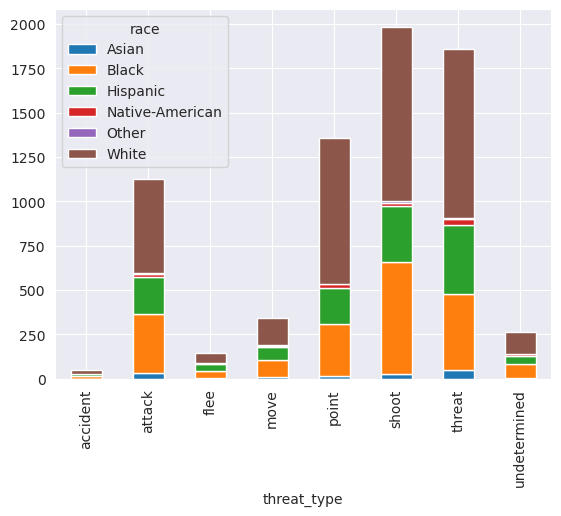

In [72]:
threat_race_dist.plot.bar(stacked=True)

As you can see by the stacked bar chart comparing types of threats in relation to ethnicity, the biggest group of victims for each threat category are whites. For the group of victims that shot using a weapon, 984 of them were whites, 626 were blacks, 318 were Hispanic, 29 were Asian, 19 were Native American, and 8 were some other race. For the group of victims that pointed a weapon at another person, 823 of them were white, 293 were black, 199 were Hispanic, 23 were Native American, and 18 were Asian.  

<AxesSubplot: xlabel='race', ylabel='age_bins'>

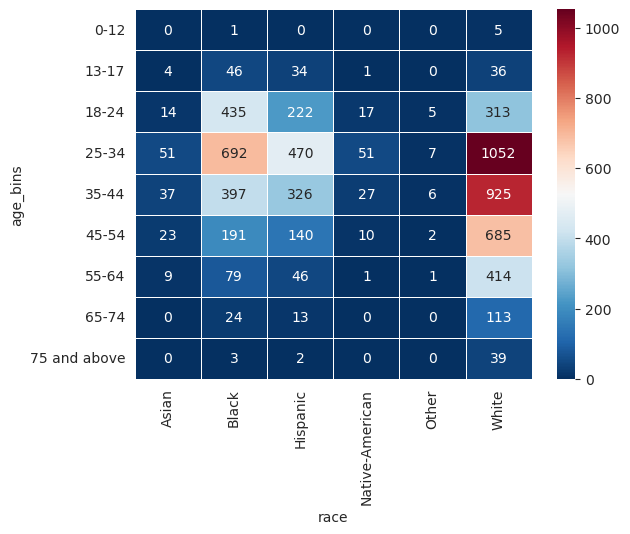

In [73]:
sns.heatmap(pd.crosstab(age_bins, ethnicity),
cmap='RdBu_r',
annot=True, fmt='g',
linewidth=0.5)

As you can see by the heatmap above looking at age groups in relation in ethnicity, the largest group of people are Whites 25-34 years old. The second largest group is also whites but 35-44 years old. Then the third and fourth largest groups are blacks 25-34 years old and whites 45-54 years old.

was_mental_illness_related,False,True
gender,,
female,243,119
male,6242,1587
non-binary,1,0


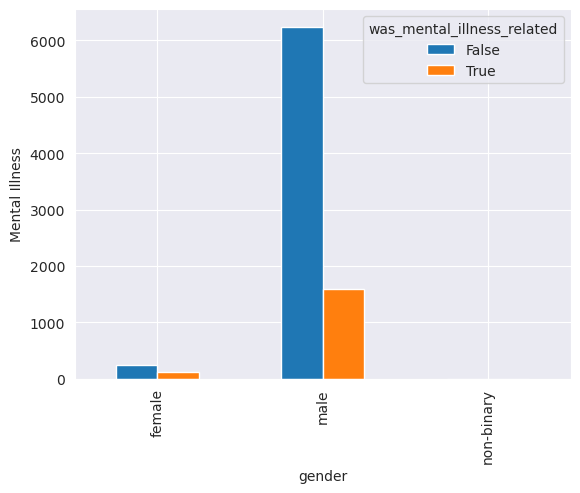

In [74]:
gender_mentalIllness = pd.crosstab(df['gender'], df['was_mental_illness_related'])
gender_mentalIllness.plot(kind='bar', xlabel="gender", ylabel="Mental Illness")
gender_mentalIllness

When we look at whether a victim shows signs of mental illness in relation to gender, we can see that there are more males that don't have a history of mental illness or distress over those that do. And when we look at female victims, there are slightly more with mental illness than those without but it's not a significant difference. 

<AxesSubplot: xlabel='race', ylabel='body_camera'>

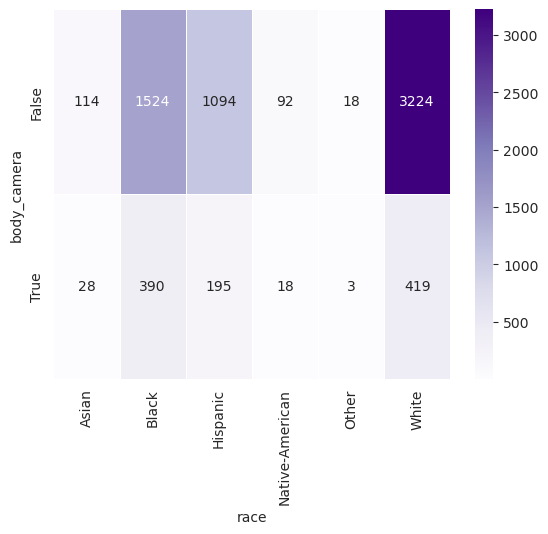

In [75]:
sns.heatmap(pd.crosstab(hasBodyCam, ethnicity),
cmap='Purples',
annot=True, fmt='g',
linewidth=0.5)

When we look at the presence of body camera with respect to race, we can see that most of the time, police aren't wearing a body camera. But when they are wearing a body camera the two largest groups of victims are whites with 419 victims, blacks with 390 victims and hispanics with 195 victims.

<AxesSubplot: xlabel='gender', ylabel='flee_status'>

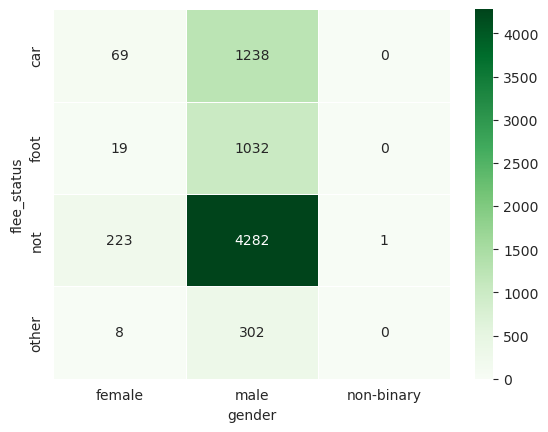

In [76]:
sns.heatmap(pd.crosstab(suspectFled, genderType),
cmap='Greens',
annot=True, fmt='g',
linewidth=0.5)

As we can see by this heatmap, for both female and male victims most of them don't flee the scene with 223 and 4282 victims respectively. The second most common way of fleeing for both genders is by car, followed by foot, and then at last they flee using some other way. 

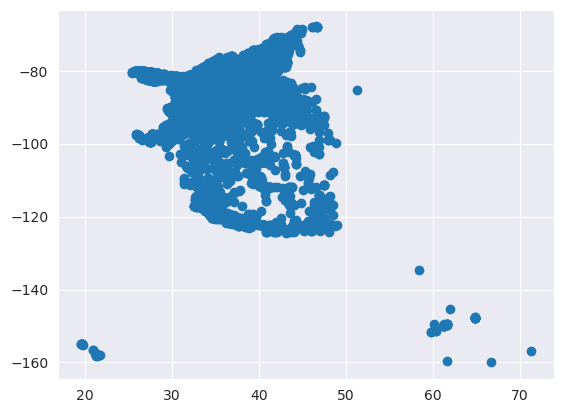

In [77]:
plt.scatter(df.latitude, df.longitude)
plt.show()

By looking at this scatterplot of longitude and latitude coordinates, we can see that the majority of the fatal police shootings occur in the same general area, that being in Los Angeles, California, Phoenix, Arizona and Houston, Texas. 

## Decision Tree #1 (protected attributes)

['LA']


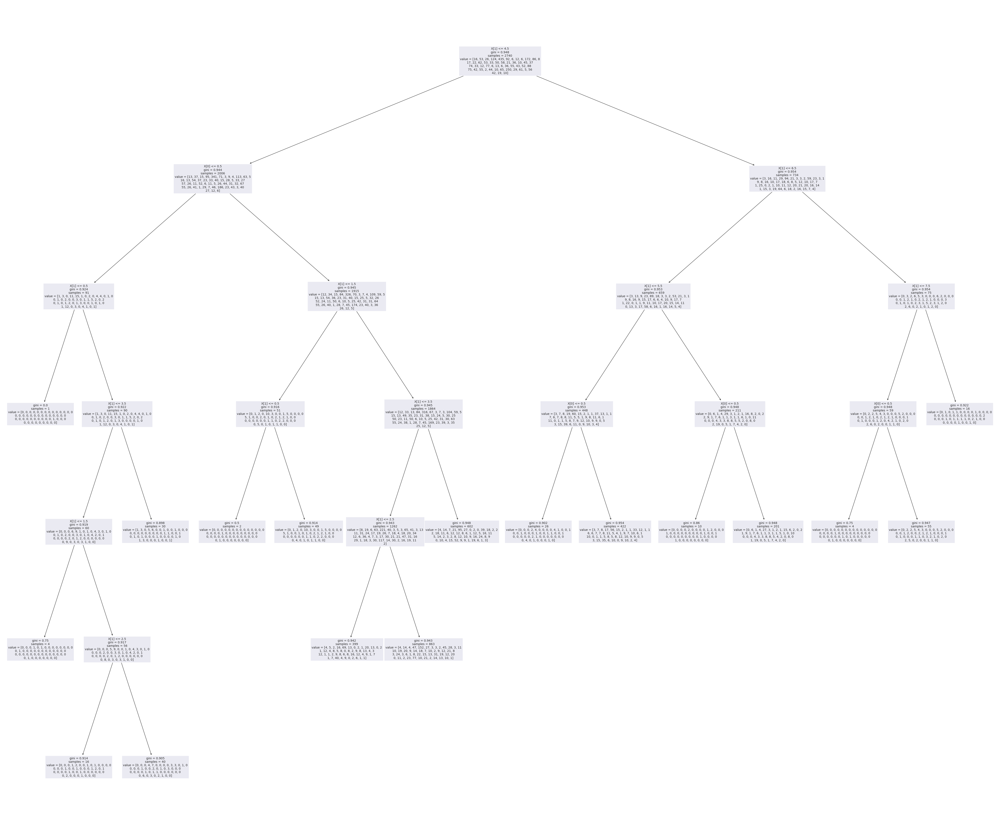

In [113]:
# Predictor with protected attributes

import pandas
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier

df = df.dropna()

d = {'male': 1, 'female': 0}
df['Gender_TEST'] = df['gender'].map(d)


d= {'0-12': 0,'13-17': 1,'18-24': 2,'25-34': 3,'35-44': 4,'45-54': 5,'55-64': 6,'65-74': 7,'75 and above': 8}
df['age_bins_TEST'] = df['age_bins'].map(d)

features = ['Gender_TEST', 'age_bins_TEST']
X = df[features]
y = df['state']

dtree = DecisionTreeClassifier()
dtree = dtree.fit(X.values, y)

print(dtree.predict([[1,0]]))

plt.figure(figsize=(60, 50))  # set plot size (denoted in inches)
tree.plot_tree(dtree, fontsize=10)
plt.show()

# tree.plot_tree(dtree, feature_names=features)

Here we are using a decision tree to predict which state the fatal police shooting occured in given gender and age. We bins the ages into 9 different groups including 0-12, 13-17, 18-24, and more. When we run the classifier on females 0-12 years old we get Pennsylvania, for 13-17 year old females we get Arizona. We get California when we run the simulation on females who fall under the 18-24, 25-34, 35-44, 45-54, and 55-64 age groups. For females 65-74 we get Louisiana and for females 75 and older we get North Carolina. When we run the decision tree on males 0-12 years old we get Louisiana. When we run the simulation on males in the 13-17, 18-24, 25-34, 35-44, 45-54, and 55-64 age groups we get California. For males aged 65-74 we get Arizona and for males 75 and above we get North Carolina. 

## Decision Tree #2 (protected attributes)

['Sun City']


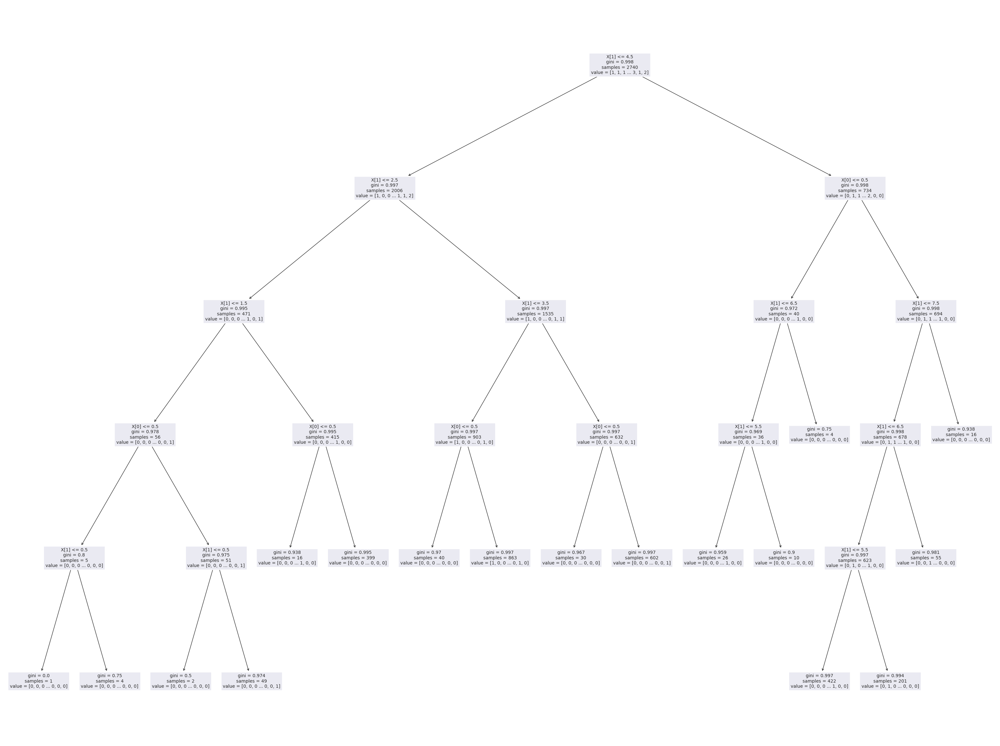

In [135]:
# Predictor with protected attributes

import pandas
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier

d = {'male': 1, 'female': 0}
df['Gender_TEST'] = df['gender'].map(d)

d= {'0-12': 0,'13-17': 1,'18-24': 2,'25-34': 3,'35-44': 4,'45-54': 5,'55-64': 6,'65-74': 7,'75 and above': 8}
df['age_bins_TEST'] = df['age_bins'].map(d)

features = ['Gender_TEST', 'age_bins_TEST']
X = df[features]
y = df['city']

dtree = DecisionTreeClassifier()
dtree = dtree.fit(X.values, y)

print(dtree.predict([[1,7]]))

plt.figure(figsize=(40, 30))  # set plot size (denoted in inches)
tree.plot_tree(dtree, fontsize=10)
plt.show()

# tree.plot_tree(dtree, feature_names=features)

Here we are using a decision tree to predict which city the fatal police shooting occured in given gender and age. When we run the classfier on males aged 0-12 we get Marksville, Louisiana. For males aged 13-17, 18-24, 25-34, 35-44 we ge Los Angeles, California as the result. For males aged 45-54 we get Miami, Florida and for males aged 55-64 we get Las Vegas, Nevada. When we run the simulation on males aged 65-74 the result is Sun City, Arizona, and finally for males 75 and older we get Birmingham, Alabama. When we run the decision tree on females aged 0-12 we get Penn Township, Pennsylvania, for females 13-17 years old we get Denver Colorado, and for females 18-24 we get Albuquerque, New Mexico. For females aged 25-34 we get Austin, Texas, for females aged 35-44 we get Anaheim, California, for females aged 45-54 we get Las Vegas, Nevada. For females aged 55-64 we get Aguanga, California and for females 65 to 74 and 75 and above years old we get Bronx, New York. 

## Decision Tree #3 (protected attributes)

In [120]:
# Predictor with protected attributes

import pandas
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier

d = {'male': 1, 'female': 0}
df['Gender_TEST'] = df['gender'].map(d)


d= {'0-12': 0,'13-17': 0,'18-24': 0,'25-34': 1,'35-44': 1,'45-54': 1,'55-64': 2,'65-74': 2,'75 and above': 2}
df['age_bins_TEST'] = df['age_bins'].map(d)

features = ['Gender_TEST', 'age_bins_TEST']
X = df[features]
y = df['county']

dtree = DecisionTreeClassifier()
dtree = dtree.fit(X.values, y)

print(dtree.predict([[1,2]]))

plt.figure(figsize=(100, 90))  # set plot size (denoted in inches)
tree.plot_tree(dtree, fontsize=20)
plt.show()

# tree.plot_tree(dtree, feature_names=features)

['Washington']


In this decision tree, we are predicting which county the shooting occured given gender and age. The first thing we do is bin the ages again but this time we have under 25, 25-55 and 55 and above years old. The reason we do this is because if we grouped the ages like we did in the previous two decision trees the decision tree would be harder to visualize and render. When we run the simulation for males under 25 years old and 25-55 years old, we get Los Angeles County as the result. When we run the simulation for males aged 55 and older we get Washington County. As for females under 25 years old we get Baltimore County, for females 25-55 years old we get Los Angeles County, and finally for females 55 and older we get Brazoria county as our results. So we can see that age and gender does have an affect on the county where the incident occurs. 

## Decision Tree #4 (protected attributes)

In [81]:
# Predictor with protected attributes

import pandas
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier

d = {'male': 1, 'female': 0}
df['Gender_TEST'] = df['gender'].map(d)


d= {'White': 0, 'Black': 1, 'Hispanic': 2, 'Asian': 3, 'Native-American': 4, 'Other': 5}
df['race_TEST'] = df['race'].map(d)

features = ['Gender_TEST', 'race_TEST']
X = df[features]
y = df['state']

dtree = DecisionTreeClassifier()
dtree = dtree.fit(X.values, y)

print(dtree.predict([[0,4]]))

plt.figure(figsize=(105, 95))  # set plot size (denoted in inches)
tree.plot_tree(dtree, fontsize=20)
plt.show()

# tree.plot_tree(dtree, feature_names=features)

/tmp/ipykernel_894925/3829540594.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Gender_TEST'] = df['gender'].map(d)
/tmp/ipykernel_894925/3829540594.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['race_TEST'] = df['race'].map(d)


['WA']


In this decision tree we're using gender and ethnicity again but this time we’re predicting which state the victims are from. When we run the decision tree on white, black, hispanic, asian, and other ethnicities we get California as our predicted state but when we run the simulation on native-american males we get Arkansas. When we run our classifier on females we get a lot more interesting results. So for black, asian, and other ethnicities we get California. For white females we get Texas and for hispanic females we get Arizona. And finally for native american females we get Washington as our predicted state. 

## Decision tree #5 (protected attributes)

/tmp/ipykernel_894925/1283913482.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Gender_TEST'] = df['gender'].map(d)
/tmp/ipykernel_894925/1283913482.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['race_TEST'] = df['race'].map(d)


['Fairbanks']


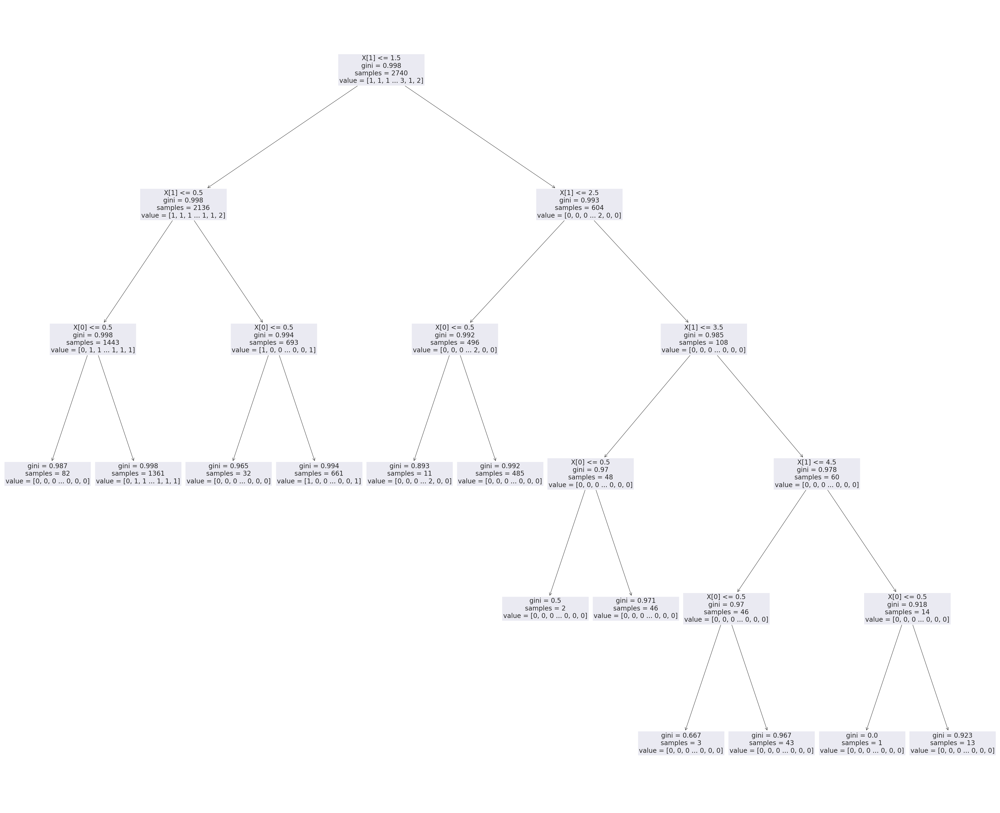

In [82]:
# Predictor with protected attributes

import pandas
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier

d = {'male': 1, 'female': 0}
df['Gender_TEST'] = df['gender'].map(d)


d= {'White': 0, 'Black': 1, 'Hispanic': 2, 'Asian': 3, 'Native-American': 4, 'Other': 5}
df['race_TEST'] = df['race'].map(d)

features = ['Gender_TEST', 'race_TEST']
X = df[features]
y = df['city']

dtree = DecisionTreeClassifier()
dtree = dtree.fit(X.values, y)

print(dtree.predict([[1,4]]))

plt.figure(figsize=(55, 45))  # set plot size (denoted in inches)
tree.plot_tree(dtree, fontsize=20)
plt.show()

# tree.plot_tree(dtree, feature_names=features)

In this decision tree we're using gender and ethnicity to predict what city the fatal police shooting occurred. For gender we assigned the number 1 for male and 0 for female and for the ethnicities we assigned a number to each one from 0 to 5. When we run the simulation on white females we get Austin, Texas, for black females we get Norfolk, Virginia, and for hispanic females we get Yuma, Arizona. For asian females we get Long Beach, California, for native american females we get Houston, Texas and for females of other ethnicities we get San Bernardino, California. When we run the simulation on males, we get Phoenix, Arizona for whites, Chicago, Illinois for blacks, Los Angeles, California for hispanics, Honolulu, Hawaii for asians, Fairbanks, Alaska for native americans, and Akron, Ohio for other ethnicities.  

# Decision Tree #6 (unprotected attributes)

/tmp/ipykernel_894925/2449254033.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['threat_type_TEST'] = df['threat_type'].map(d)
/tmp/ipykernel_894925/2449254033.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['flee_status_TEST'] = df['flee_status'].map(d)


[False]


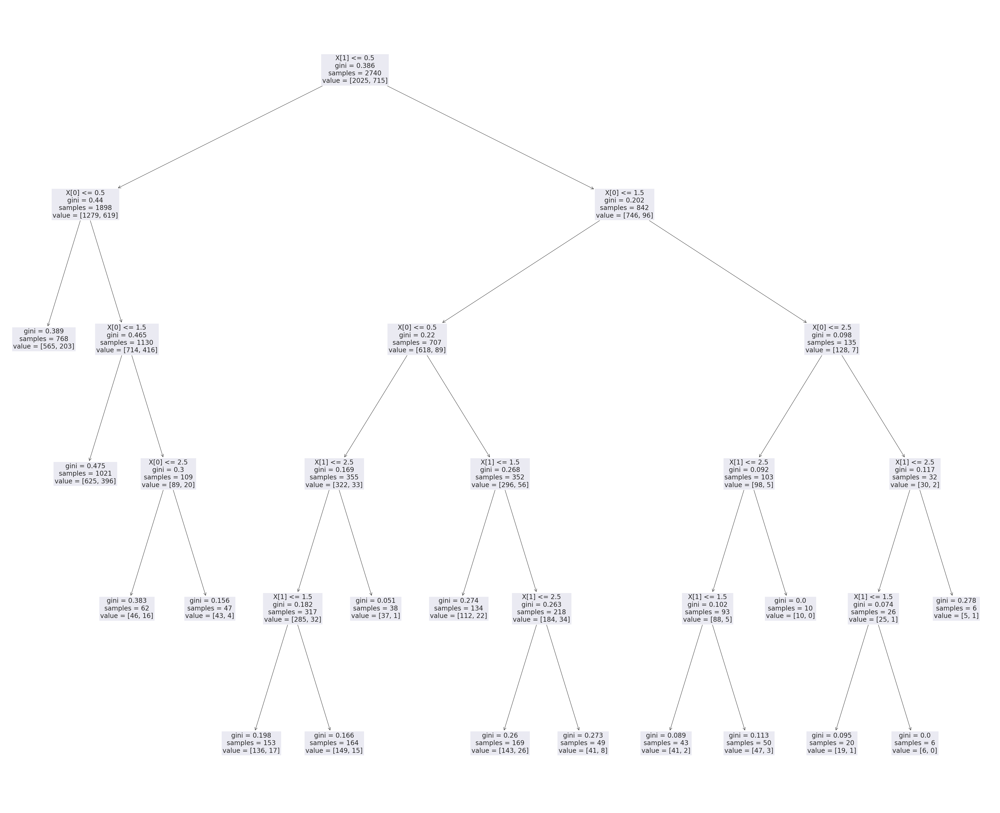

In [83]:
# Predictor without protected attributes

import pandas
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier

d = {'shoot': 0, 'attack': 0, 'threat': 1, 'point': 1, 'move': 2, 'flee': 2, 'undetermined': 3, 'accident': 3}
df['threat_type_TEST'] = df['threat_type'].map(d)


d= {'not': 0, 'car': 1, 'foot': 2, 'other': 3}
df['flee_status_TEST'] = df['flee_status'].map(d)

features = ['threat_type_TEST', 'flee_status_TEST']
X = df[features]
y = df['was_mental_illness_related']

dtree = DecisionTreeClassifier()
dtree = dtree.fit(X.values, y)

print(dtree.predict([[3,3]]))

plt.figure(figsize=(55, 45))  # set plot size (denoted in inches)
tree.plot_tree(dtree, fontsize=20)
plt.show()

# tree.plot_tree(dtree, feature_names=features)

So in this decision tree we're using the type of threat and how the victim fled the incident to determine whether or not the victim showed signs of mental illness. We bin the threat type in groups of two. For flee status we have fled by car, foot, other or didn't flee at all. For shoot or attack threats and for all of the types of flee status, the simulation returns false, indicating there were no signs of mental illness. When we run the simulation assuming the victim has the weapon visible to officers or points a weapon at someone else, we also get false for all the types of flee status. When we ran the simulation assuming the victim was moving in a threatening way or simply fled the scene we also got false for all the types of flee status. And then finally we run the simulation one last time assuming the threat type was undetermined or simply an accident, we get false again for all 4 of the flee status. So we can conclude that the type of threat and how the victim fled the scene does not affect signs of mental illness.

## Decision tree #7 (unprotected attributes)

/tmp/ipykernel_894925/398253248.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['threat_type_TEST'] = df['threat_type'].map(d)
/tmp/ipykernel_894925/398253248.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['flee_status_TEST'] = df['flee_status'].map(d)


[False]


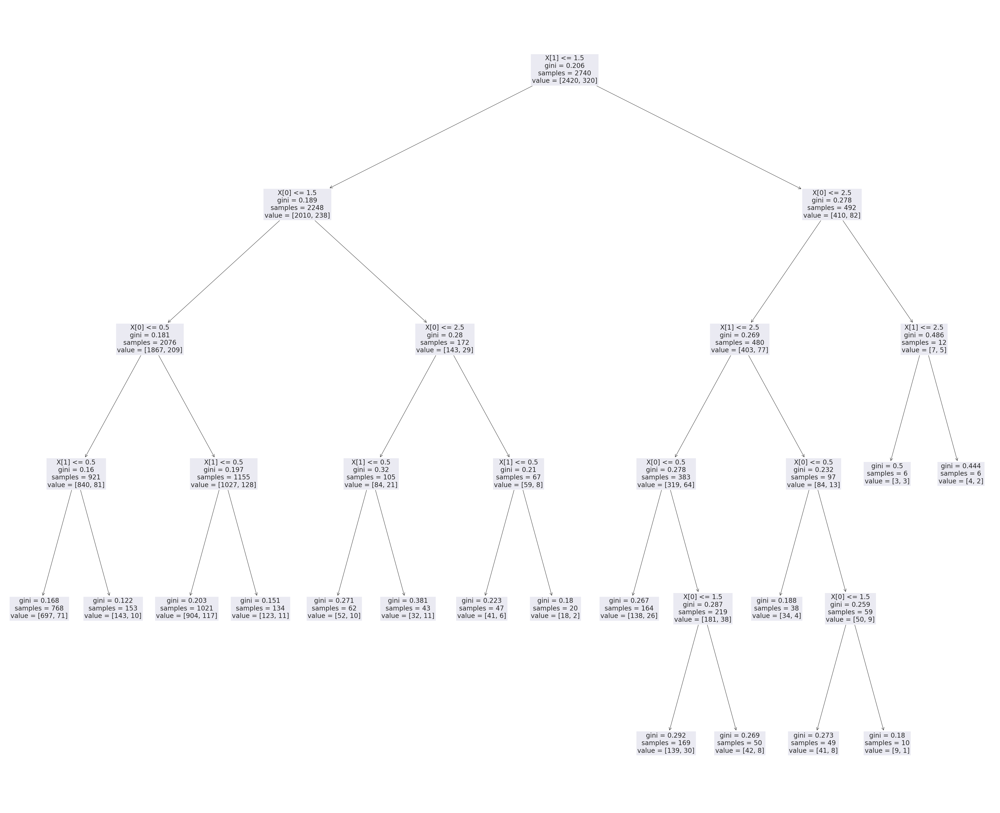

In [84]:
# Predictor without protected attributes

import pandas
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier

d = {'shoot': 0, 'attack': 0, 'threat': 1, 'point': 1, 'move': 2, 'flee': 2, 'undetermined': 3, 'accident': 3}
df['threat_type_TEST'] = df['threat_type'].map(d)


d= {'not': 0, 'car': 1, 'foot': 2, 'other': 3}
df['flee_status_TEST'] = df['flee_status'].map(d)

features = ['threat_type_TEST', 'flee_status_TEST']
X = df[features]
y = df['body_camera']

dtree = DecisionTreeClassifier()
dtree = dtree.fit(X.values, y)

print(dtree.predict([[3,3]]))

plt.figure(figsize=(55, 45))  # set plot size (denoted in inches)
tree.plot_tree(dtree, fontsize=20)
plt.show()

# tree.plot_tree(dtree, feature_names=features)

So in this decision tree we're using the type of threat and how the victim fled the incident to determine whether or not a body camera was used by the police officer at the scene. For shoot or attack threats and for all of the types of flee status, the similation returns false, indicating there were no body cameras used. When we run the simulation assuming the victim has the weapon visible to officers or points a weapon at someone else, we also get false for all the types of flee status. When we ran the simulation assuming the victim was moving in a threatening way or simply fled the scene we also got false for all the types of flee status. And then finally we run the simulation one last time assuming the threat type was undetermined or simply an accident, we get false again for all 4 of the flee status. So we can conclude that the type of threat and how the victim fled the scene does not affect whether a body camera was worn. 

## Decision tree #8 (unprotected attributes)

In [85]:
# Predictor without protected attributes

import pandas
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier

d= {'not': 0, 'car': 1, 'foot': 2, 'other': 3}
df['flee_status_TEST'] = df['flee_status'].map(d)

d= {'gun': 0, 'gun and vehicle': 0, 'knife': 1, 'gun and knife': 1, 'vehicle': 2, 'knife and vehicle': 2, 'replica': 3, 'replica and vehicle': 3, 'blunt object': 4, 'knife and blunt object': 4, 'undetermined': 5, 'other': 5, 'unarmed': 6}
df['armed_with_TEST'] = df['armed_with'].map(d)

features = ['flee_status_TEST', 'armed_with_TEST']
X = df[features]
y = df['race']

dtree = DecisionTreeClassifier()
dtree = dtree.fit(X.values, y)

print(dtree.predict([[2,2]]))

plt.figure(figsize=(100, 90))  # set plot size (denoted in inches)
tree.plot_tree(dtree, fontsize=20)
plt.show()

# tree.plot_tree(dtree, feature_names=features)

/tmp/ipykernel_894925/2680260103.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['flee_status_TEST'] = df['flee_status'].map(d)
/tmp/ipykernel_894925/2680260103.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['armed_with_TEST'] = df['armed_with'].map(d)


['White']


In this decision tree we are using flee status and the type of weapon the victim was armed with to predict the ethnicity of the victim. We bin the weapons in groups of 2. When we ran the simulation on victims who didn't flee at all, the result was white for race for each type of weapon. We got the same results again for victims that fled by car. When we ran the simulation on victims that fled by foot, we got white as the race if they had a knife, a gun and knife, a vehicle, a knife and vehicle, a replica, replica and vehicle, blunt object, or a knife and blunt object. We got black as the race if they had a gun or a gun and vehicle, undetermined weapon, or if they were unarmed. When we ran the simulation on victims who fled some other way besides car or foot, we got white as the race if they had a gun, gun and vehicle, replica, replica and vehicle, blunt object or knife and blunt object. The result was hispanic if they had a knife, gun and knife, vehicle, or knife and vehicle. And finally we got black as our race if they were unarmed.

## Random-force algorithm (predicting latitude)

In [86]:
#First, we need to prepare the dataset by selecting the features we want to use to predict 
#the latitude and removing any missing values:

import pandas as pd
from sklearn.ensemble import RandomForestRegressor


# Select the features and target variable
X = df[['age', 'gender', 'race', 'armed_with', 'city', 'state', 'was_mental_illness_related', 'threat_type', 'flee_status', 'body_camera', 'longitude']]
y = df['latitude']

# Remove missing values
X = X.dropna()
y = y[X.index]
#Next, we need to convert categorical features into numerical values using one-hot encoding:


# Convert categorical features to numerical values
X = pd.get_dummies(X, columns=['gender', 'race', 'armed_with', 'city', 'state', 'was_mental_illness_related', 'threat_type', 'flee_status', 'body_camera'])
#Now we can split the dataset into training and testing sets:


# Split the dataset into training and testing sets
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
#Finally, we can train a random forest regressor on the training set and evaluate its performance on the testing set:


# Train a random forest regressor
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# Evaluate the model on the testing set
from sklearn.metrics import r2_score

y_pred = rf.predict(X_test)
r2_score(y_test, y_pred)

#This code will train a random forest regressor with 100 trees and evaluate its performance on the testing set 
#using the R-squared score. The R-squared score measures the proportion of variance in the target variable that 
#is explained by the model, 
# A score of 1 would indicate a perfect fit and a score of 0 would indicate there was 
#no improvement over our baseline model.

0.9689041792665002

## Random-force algorithm (predicting longitude)

In [87]:
# Now we observe for Longitude 

import pandas as pd
from sklearn.ensemble import RandomForestRegressor

# Select the features and target variable
X = df[['age', 'gender', 'race', 'armed_with', 'city', 'state', 'was_mental_illness_related', 'threat_type', 'flee_status', 'body_camera', 'latitude']]
y = df['longitude']

# Remove missing values
#Next, we need to convert categorical features into numerical values using one-hot encoding:
X = X.dropna()
y = y[X.index]

# Convert categorical features to numerical values
X = pd.get_dummies(X, columns=['gender', 'race', 'armed_with', 'city', 'state', 'was_mental_illness_related', 'threat_type', 'flee_status', 'body_camera'])

# Split the dataset into training and testing sets
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a random forest regressor
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# Evaluate the model on the testing set
from sklearn.metrics import r2_score

y_pred = rf.predict(X_test)
r2_score(y_test, y_pred)

#This code will train a random forest regressor with 100 trees and evaluate its performance on the testing set 
#using the R-squared score. The R-squared score measures the proportion of variance in the target variable that 
#is explained by the model, 
# A score of 1 would indicate a perfect fit and a score of 0 would indicate there was 
#no improvement over our baseline model.

0.9683484946593329

/tmp/ipykernel_894925/1736013644.py:7: UserWarning: 

`shade_lowest` has been replaced by `thresh`; setting `thresh=0.05.
This will become an error in seaborn v0.13.0; please update your code.

  sns.kdeplot(x=X_train['age'], y=y_train, cmap='Blues', shade=True, shade_lowest=False)
/tmp/ipykernel_894925/1736013644.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(x=X_train['age'], y=y_train, cmap='Blues', shade=True, shade_lowest=False)


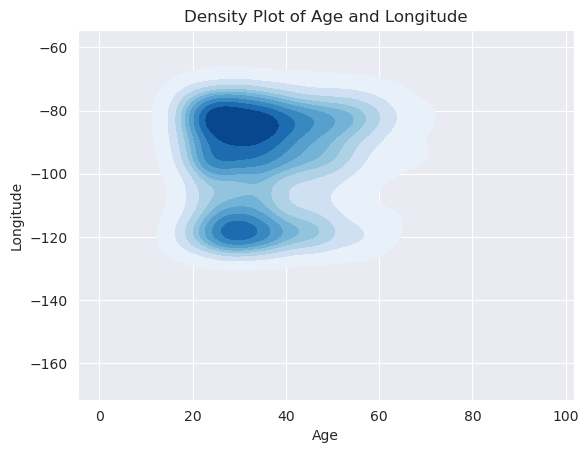

In [88]:
# Observation for Longitude
import seaborn as sns

sns.set_style('darkgrid')

# Plot the density plot
sns.kdeplot(x=X_train['age'], y=y_train, cmap='Blues', shade=True, shade_lowest=False)


plt.xlabel('Age')
plt.ylabel('Longitude')
plt.title('Density Plot of Age and Longitude')
plt.show()

/tmp/ipykernel_894925/3779608206.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gender_code'] = gender_codes
/tmp/ipykernel_894925/3779608206.py:14: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=df, x='gender_code', y='longitude', cmap='Blues', shade=True, thresh=0.05, bw_adjust=2)


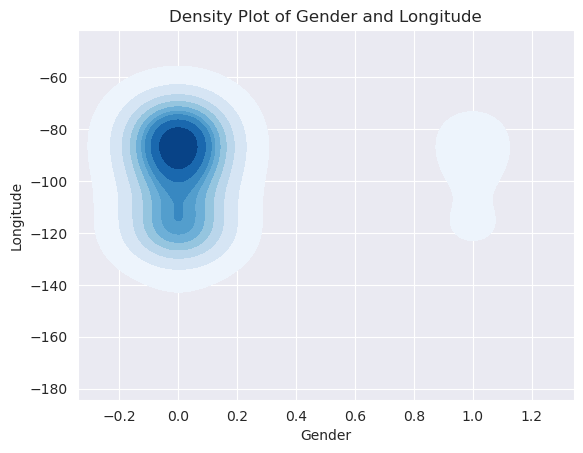

In [90]:
# Observation for Longitude
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_style('darkgrid')

# Map categorical values to numerical values
gender_codes, gender_labels = pd.factorize(df['gender'])

# Update dataframe with numerical values
df['gender_code'] = gender_codes

# Plot the density plot with wider bandwidth
sns.kdeplot(data=df, x='gender_code', y='longitude', cmap='Blues', shade=True, thresh=0.05, bw_adjust=2)


plt.xlabel('Gender')
plt.ylabel('Longitude')
plt.title('Density Plot of Gender and Longitude')

plt.show()

/tmp/ipykernel_894925/2164657749.py:7: UserWarning: 

`shade_lowest` has been replaced by `thresh`; setting `thresh=0.05.
This will become an error in seaborn v0.13.0; please update your code.

  sns.kdeplot(x=X_train['age'], y=y_train, cmap='Blues', shade=True, shade_lowest=False)
/tmp/ipykernel_894925/2164657749.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(x=X_train['age'], y=y_train, cmap='Blues', shade=True, shade_lowest=False)


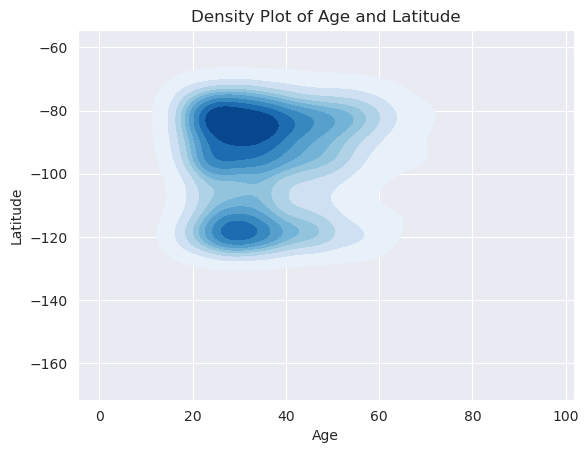

In [91]:
# Observation for Latitude
import seaborn as sns

sns.set_style('darkgrid')

# Plot the density plot
sns.kdeplot(x=X_train['age'], y=y_train, cmap='Blues', shade=True, shade_lowest=False)


plt.xlabel('Age')
plt.ylabel('Latitude')
plt.title('Density Plot of Age and Latitude')
plt.show()

For the age and longitude/latitude for 20 to 60 year olds most of the coordinates are grouped in clusters indicating the shootings occured within the same general city or county. 

/tmp/ipykernel_894925/3861711397.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gender_code'] = gender_codes
/tmp/ipykernel_894925/3861711397.py:14: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=df, x='gender_code', y='longitude', cmap='Blues', shade=True, thresh=0.05, bw_adjust=2)


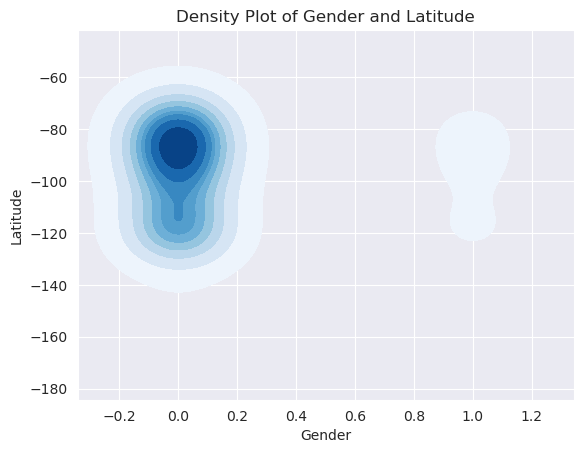

In [92]:
# Observation for Latitude
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_style('darkgrid')

# Map categorical values to numerical values
gender_codes, gender_labels = pd.factorize(df['gender'])

# Update dataframe with numerical values
df['gender_code'] = gender_codes

# Plot the density plot with wider bandwidth
sns.kdeplot(data=df, x='gender_code', y='longitude', cmap='Blues', shade=True, thresh=0.05, bw_adjust=2)


plt.xlabel('Gender')
plt.ylabel('Latitude')
plt.title('Density Plot of Gender and Latitude')

plt.show()

For the gender and longitude/latitude density plot the  values are distributed more evenly for males but there are more outliers in the -140 to -160 range whereas the values for females aren't spread out as much and closer together.

## Conclusion:
What we learned is that when predicting the state of the fatal police shooting with respect to gender and age using decision trees, the result is California for most age groups in both males and females unless you're very young or very old. When using gender and age to predict the city of a fatal police shooting the result for males is about the same regardless of age however for females age definitely plays a factor in which city the shooting occured in. The same thing can be said when we use gender and age to predict the county in which the shooting occured in. When we use gender and replace age with ethnicity to predict the state on which the incident occured, the ethnicity doesn't affect the outcome for males but for females it does. As far as unprotected attributes go, the type of threat and whether or not the victim fled the scene does not indicate whether or not they showed signs of mentall illness and whether or not the police officer was using a body camera. With our random-force algorithm, our model can predict a near perfect fit for both longitude and latitude. 